# Spatial clustering of Nanostring CosMx spatial transcriptomics data
This tutorial shows an example of spatial clustering of a subset of the CosMx dataset of Non-Small Cell Lung Cancer (NSCLC) from [He et al., 2022](https://doi.org/10.1038/s41587-022-01483-z) using CellCharter.
It is a single-cell spatial transcriptomics dataset composed of 8 samples from 5 different patients for a total of more than 800k cells assyed for around 960 genes. We are going to use two samples from non-adjacent sections of patient 9. <br>
We are going to use scVI for dimensionality reduction and CellCharter to compute the spatial clusters of all samples together.

## Data preprocessing
Let's first load the packages that will be necessary for the analysis and download the data from Nanostring's webiste.

In [1]:
import anndata as ad
import squidpy as sq
import cellcharter as cc
import pandas as pd
import scanpy as sc
import scvi
import numpy as np
import matplotlib.pyplot as plt
from lightning.pytorch import seed_everything

seed_everything(12345)
scvi.settings.seed = 12345

/mnt/etemp/varrone/mamba_envs/cellcharter-dev/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 captum (see https://github.com/pytorch/captum).
Seed set to 12345
Seed set to 12345


In [2]:
!mkdir tutorial_data
!mkdir tutorial_data/nanostring_data
!wget -P tutorial_data/nanostring_data https://nanostring-public-share.s3.us-west-2.amazonaws.com/SMI-Compressed/Lung9_Rep1/Lung9_Rep1+SMI+Flat+data.tar.gz
!wget -P tutorial_data/nanostring_data https://nanostring-public-share.s3.us-west-2.amazonaws.com/SMI-Compressed/Lung9_Rep2/Lung9_Rep2+SMI+Flat+data.tar.gz
!tar -xzf tutorial_data/nanostring_data/Lung9_Rep1+SMI+Flat+data.tar.gz -C tutorial_data/nanostring_data/.
!tar -xzf tutorial_data/nanostring_data/Lung9_Rep2+SMI+Flat+data.tar.gz -C tutorial_data/nanostring_data/.

mkdir: cannot create directory ‘tutorial_data’: File exists
mkdir: cannot create directory ‘tutorial_data/nanostring_data’: File exists
--2024-08-21 17:07:52--  https://nanostring-public-share.s3.us-west-2.amazonaws.com/SMI-Compressed/Lung9_Rep1/Lung9_Rep1+SMI+Flat+data.tar.gz
Resolving nanostring-public-share.s3.us-west-2.amazonaws.com (nanostring-public-share.s3.us-west-2.amazonaws.com)... 3.5.84.124, 52.218.221.89, 3.5.77.73, ...
Connecting to nanostring-public-share.s3.us-west-2.amazonaws.com (nanostring-public-share.s3.us-west-2.amazonaws.com)|3.5.84.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1078783664 (1.0G) [binary/octet-stream]
Saving to: ‘tutorial_data/nanostring_data/Lung9_Rep1+SMI+Flat+data.tar.gz.9’

Lung9_Rep1+SMI+Flat 100%[===================>]   1.00G  17.4MB/s    in 61s     

2024-08-21 17:08:54 (16.8 MB/s) - ‘tutorial_data/nanostring_data/Lung9_Rep1+SMI+Flat+data.tar.gz.9’ saved [1078783664/1078783664]

--2024-08-21 17:08:55--  https

We are going to analyze both samples together to show common cellular niches between the two sections. <br>
Hence, we create a list of the 2 anndata associated with each sample and we concatenate it into a single anndata.

In [3]:
adata_list = []
for sample in ['Lung9_Rep1', 'Lung9_Rep2']:
    adata = sq.read.nanostring(
        path=f'tutorial_data/nanostring_data/{sample}/{sample}-Flat_files_and_images', 
        counts_file=f'{sample}_exprMat_file.csv',
        meta_file=f'{sample}_metadata_file.csv',
        fov_file=f'{sample}_fov_positions_file.csv'
    )

    # Flip y axis
    adata.obsm['spatial_fov'][:, 1] = np.max(adata.obsm['spatial_fov'][:, 1]) - adata.obsm['spatial_fov'][:, 1]

    # Remove negative probes
    adata = adata[:, [c for c in adata.var_names if 'NegPrb' not in c]].copy()
    
    adata.obs['sample'] = sample
    adata_list.append(adata)

In [4]:
adata = ad.concat(adata_list, axis=0, merge='same', pairwise=True, index_unique='_')

# 'spatial_fov' refers to global coordinates of the cells.
# Thus, we are going to use 'spatial_fov' and not 'spatial' as spatial coordinates.
adata.uns['spatial_fov'] = {s: {} for s in adata.obs['sample'].unique()}
adata.obs['sample'] = pd.Categorical(adata.obs['sample'])
adata

AnnData object with n_obs × n_vars = 242476 × 960
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'sample'
    uns: 'spatial_fov'
    obsm: 'spatial', 'spatial_fov'

We normalize the data similarly to what is done in the non-spatial single-cell case.

In [5]:
sc.pp.filter_genes(adata, min_counts=3)
sc.pp.filter_cells(adata, min_counts=3)

In [6]:
adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

## Dimensionality reduction
In case of transcriptomics data, it's better to reduce the dimensionality of the data before computing the spatial clusters. <br>
We found that scVI is a good method for this task and it can scale to large datasets and it can also be used to reduce batch effects through the `batch_key` parameter. <br><br>
We are going to use the default parameters of scVI and reduce the dimensionality from 960 to 10 features, but you can find more information about the parameters in the [scVI documentation](https://docs.scvi-tools.org/en/stable/api/reference/scvi.model.SCVI.html#scvi.model.SCVI).

In [7]:
scvi.model.SCVI.setup_anndata(
    adata, 
    layer="counts", 
    batch_key='sample',
)

model = scvi.model.SCVI(adata)

In [8]:
model.train(early_stopping=True, enable_progress_bar=True)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


Epoch 13/33:  36%|███▋      | 12/33 [05:26<09:30, 27.18s/it, v_num=1, train_loss_step=329, train_loss_epoch=343]

In [ ]:
adata.obsm['X_scVI'] = model.get_latent_representation(adata).astype(np.float32)

## CellCharter's spatial clustering
It's now time to compute the spatial clusters.<br>
CellCharter encodes all cells of each sample as a network. Every cell is a node and two cells are connected by an edge if they are physically close to each other in the tissue.
We can obtain this network using squidpy's `gr.spatial_neighbors` function. <br> <br>
As shown in the [CODEX notebook](https://cellcharter.readthedocs.io/en/latest/notebooks/codex_mouse_spleen.html), the Delaunay triangulation has the drawback of generating connections between distant cells.<br>
We remove this long links using CellCharter's `gr.remove_long_links` function.


In [ ]:
sq.gr.spatial_neighbors(adata, library_key='sample', coord_type='generic', delaunay=True, spatial_key='spatial_fov', percentile=99)

The next step is the neighborhood aggregation, that incorporates the features of a cell's environment (i.e. neighbors) into the features of the cell itself. <br>
It consists of concatenating the features of every cell with the features aggregated from neighbors ad increasing layers from the considered cell, up to a certain layer `n_layers`.<br>
Aggregation functions are used to obtain a single feature vector from the vectors of multiple neighbors, with the default being the `mean` function.

In this case we use 3 layers of neighbors, so we obtain, for each cell, a feature vector of length 40. That is the cell's reduced vector size from scVI (10) plus the 3 aggregated vectors of length 10 each, from the 3 layers of neighbors.

In [ ]:
cc.gr.aggregate_neighbors(adata, n_layers=3, use_rep='X_scVI', out_key='X_cellcharter', sample_key='sample')

100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


Now we can cluster cells based on these features that merge the information of each cell with its neighbors. <br>
If already have a specific number of clusters in mind, you can use the `tl.Cluster` class as shown in the [CODEX notebook](https://cellcharter.readthedocs.io/en/latest/notebooks/codex_mouse_spleen.html#cellcharter-s-spatial-clustering). <br><br>
However, if you want to use CellCharter's stability analysis to suggest the best candidates for the number of clusters, you can use the `tl.ClusterAutoK` class. <br>
It is going to repeat `max_runs` times the clustering for each value K in the range provided in the `n_clusters` parameter and it will compute the stability between adjacent Ks, as described in [CellCharter's paper](https://doi.org/10.1101/2023.01.10.523386). If the stability curve between two runs doesn't change by more than the `convergence_tol` parameter, the process will complete early without running the full `max_runs` times. <br>

Of course, this will increase the computational time, but the scalability of CellCharter's clustering step makes this analysis tractable even for large-scale datasets. <br>

In [ ]:
autok = cc.tl.ClusterAutoK(
    n_clusters=(2,10), 
    max_runs=10,
    convergence_tol=0.001
)

In [ ]:
autok.fit(adata, use_rep='X_cellcharter')

Iteration 1/10


100%|██████████| 11/11 [01:15<00:00,  6.85s/it]


Iteration 2/10


100%|██████████| 11/11 [01:14<00:00,  6.74s/it]


Iteration 3/10


100%|██████████| 11/11 [01:20<00:00,  7.35s/it]


Iteration 4/10


100%|██████████| 11/11 [01:18<00:00,  7.17s/it]


Iteration 5/10


100%|██████████| 11/11 [01:27<00:00,  7.97s/it]


Iteration 6/10


100%|██████████| 11/11 [01:21<00:00,  7.41s/it]


Iteration 7/10


100%|██████████| 11/11 [01:11<00:00,  6.51s/it]


Iteration 8/10


100%|██████████| 11/11 [01:08<00:00,  6.21s/it]


Convergence with a change in stability of 0.008328176018855049 reached after 8 iterations


The best candidates for the number of clusters are the ones associated with peaks of stability. In this case, 8 is a good candidate.

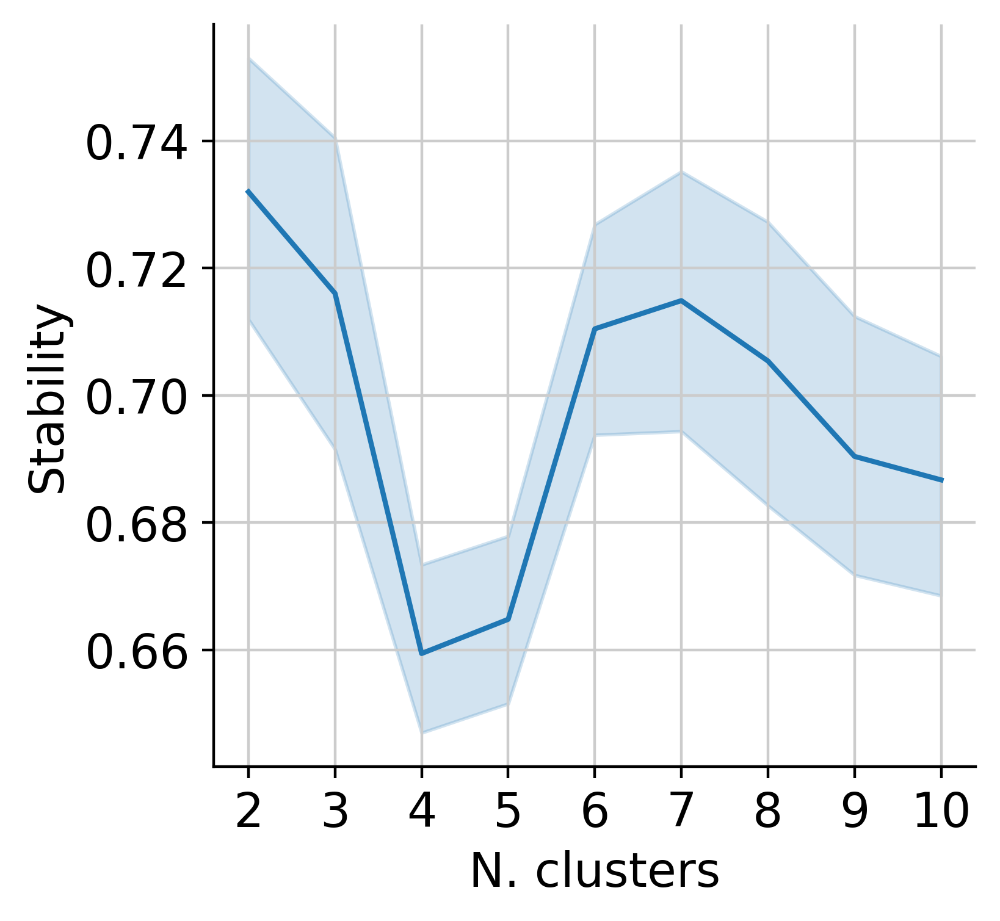

In [ ]:
cc.pl.autok_stability(autok)

If we omit the `k` parameter in `autok.predict`, CellCharter will automatically cluster cells with the number of clusters assoiated with the highest stability. <br>
We can still choose the number of clusters by setting the `k` parameter to the desired value.

In [ ]:
adata.obs['cluster_cellcharter'] = autok.predict(adata, use_rep='X_cellcharter')

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


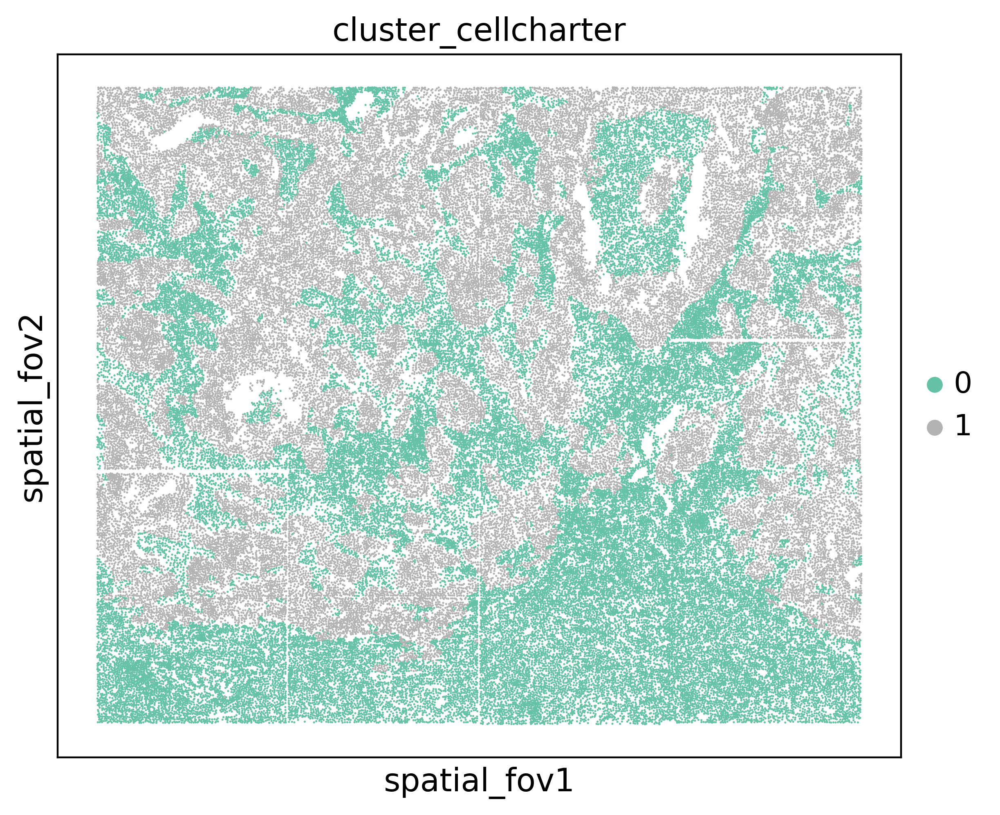

In [ ]:
sq.pl.spatial_scatter(
    adata, 
    color=['cluster_cellcharter'], 
    library_key='sample',  
    size=30, 
    img=None,
    spatial_key='spatial_fov',
    palette='Set2',
    figsize=(6,6),
    ncols=1,
    library_id=['Lung9_Rep1'],
)

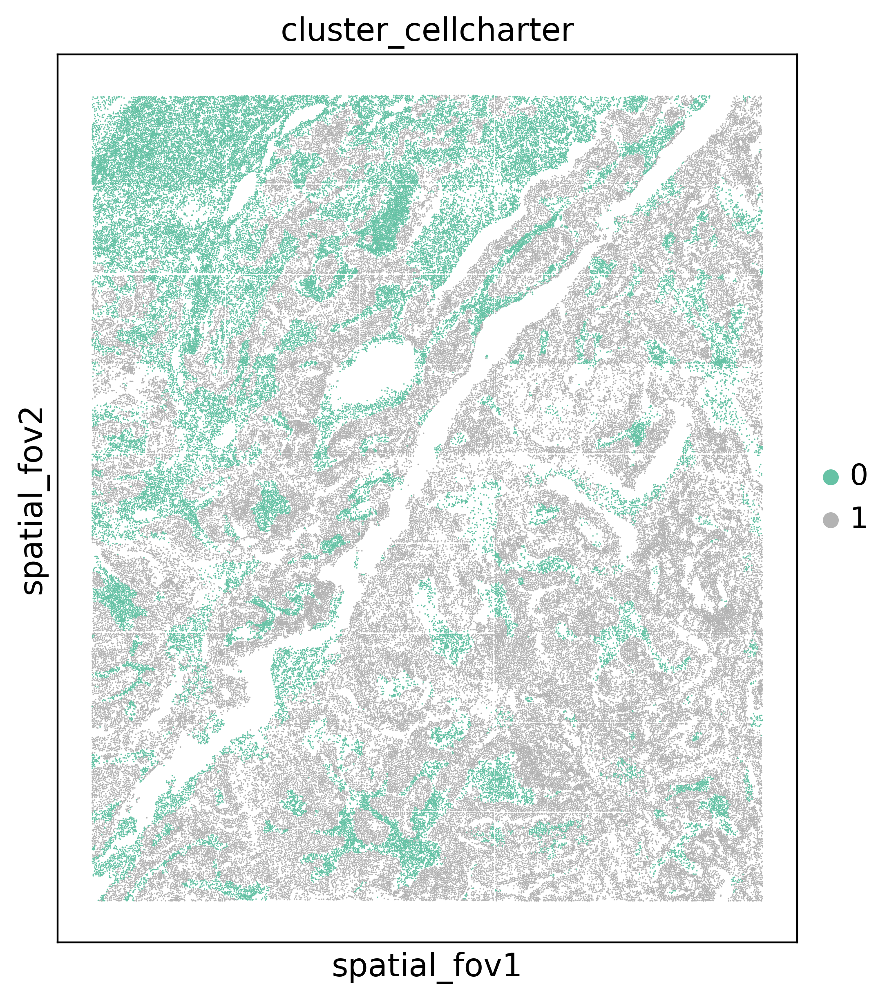

In [ ]:
sq.pl.spatial_scatter(
    adata, 
    color=['cluster_cellcharter'], 
    library_key='sample',  
    size=30, 
    img=None,
    spatial_key='spatial_fov',
    figsize=(6,6),
    ncols=1,
    library_id=['Lung9_Rep2'],
)